In [ ]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.preprocessing import OneHotEncoder
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import sklearn
from scipy.stats import mode, trim_mean
from scipy.stats import iqr, skew
from sklearn import model_selection, preprocessing, metrics
from sklearn.metrics import mean_squared_error
from pandas.plotting import scatter_matrix
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.impute import SimpleImputer
from pandas import get_dummies
import lightgbm as lgb
import xgboost as xgb
import warnings

In [ ]:

%matplotlib inline
%precision 4
plt.style.use('ggplot')
np.set_printoptions(suppress=True)
pd.set_option("display.precision", 15)

#ignore warnings
import warnings
warnings.filterwarnings('ignore')

# Graphics in retina format are more sharp and legible
%config InlineBackend.figure_format = 'retina'

In [ ]:
pip install openpyxl

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving public_layout.csv to public_layout.csv
Saving recs2009_public.csv to recs2009_public.csv


In [ ]:
#data file
data = pd.read_csv("/content/recs2009_public.csv")

layout = pd.read_csv('/content/public_layout.csv')


In [ ]:
data.head()

,DOEID,REGIONC,DIVISION,REPORTABLE_DOMAIN,TYPEHUQ,NWEIGHT,HDD65,CDD65,HDD30YR,CDD30YR,...,SCALEKER,IECC_Climate_Pub,HDD50,CDD80,GND_HDD65,WSF,OA_LAT,GWT,DesignDBT99,DesignDBT1
0,1,2,4,12,2,2471.679999999999836,4742,1080,4953,1271,...,-2,4A,2117,56,4250,0.48,6,56,9,96
1,2,4,10,26,2,8599.170000000000073,2662,199,2688,143,...,-2,3C,62,26,2393,0.61,0,64,38,73
2,3,1,1,1,5,8969.920000000000073,6233,505,5741,829,...,-2,5A,2346,49,5654,0.48,3,52,12,88
3,4,2,3,7,2,18003.639999999999418,6034,672,5781,868,...,-2,5A,2746,0,4941,0.55,4,55,7,87
4,5,1,1,1,3,5999.609999999999673,5388,702,5313,797,...,-2,5A,2251,0,5426,0.61,4,50,13,90


In [ ]:
layout.head()

,Variable Name,Variable Label,Variable Order in File,Variable Type,Length
0,DOEID,Unique identifier for each respondent,1,Character,5
1,REGIONC,Census Region,2,Numeric,8
2,DIVISION,Census Division,3,Numeric,8
3,REPORTABLE_DOMAIN,Reportable states and groups of states,4,Numeric,8
4,TYPEHUQ,Type of housing unit,5,Numeric,8


In [ ]:
layout

,Variable Name,Variable Label,Variable Order in File,Variable Type,Length
0,DOEID,Unique identifier for each respondent,1,Character,5
1,REGIONC,Census Region,2,Numeric,8
2,DIVISION,Census Division,3,Numeric,8
3,REPORTABLE_DOMAIN,Reportable states and groups of states,4,Numeric,8
4,TYPEHUQ,Type of housing unit,5,Numeric,8
...,...,...,...,...,...
935,WSF,Weather & shielding factor for the housing unit,936,Numeric,8
936,OA_LAT,Annual value for latent heat infiltration from...,937,Numeric,8
937,GWT,Annual average ground water temperature (F) fo...,938,Numeric,8
938,DesignDBT99,Dry bulb design temperature (F) expected to be...,939,Numeric,8


In [ ]:
data.head()

,DOEID,REGIONC,DIVISION,REPORTABLE_DOMAIN,TYPEHUQ,NWEIGHT,HDD65,CDD65,HDD30YR,CDD30YR,...,SCALEKER,IECC_Climate_Pub,HDD50,CDD80,GND_HDD65,WSF,OA_LAT,GWT,DesignDBT99,DesignDBT1
0,1,2,4,12,2,2471.679999999999836,4742,1080,4953,1271,...,-2,4A,2117,56,4250,0.48,6,56,9,96
1,2,4,10,26,2,8599.170000000000073,2662,199,2688,143,...,-2,3C,62,26,2393,0.61,0,64,38,73
2,3,1,1,1,5,8969.920000000000073,6233,505,5741,829,...,-2,5A,2346,49,5654,0.48,3,52,12,88
3,4,2,3,7,2,18003.639999999999418,6034,672,5781,868,...,-2,5A,2746,0,4941,0.55,4,55,7,87
4,5,1,1,1,3,5999.609999999999673,5388,702,5313,797,...,-2,5A,2251,0,5426,0.61,4,50,13,90


In [ ]:
data.shape, layout.shape

((12083, 940), (940, 5))

In [ ]:
numerical_feats = data.dtypes[data.dtypes != "object"].index
print("Number of Numerical features: ", len(numerical_feats))

categorical_feats = data.dtypes[data.dtypes == "object"].index
print("Number of Categorical features: ", len(categorical_feats))

Number of Numerical features:  935
Number of Categorical features:  5


In [ ]:
data.isnull().sum().sum()

0

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12083 entries, 0 to 12082
Columns: 940 entries, DOEID to DesignDBT1
dtypes: float64(50), int64(885), object(5)
memory usage: 86.7+ MB


In [ ]:
data.dtypes

DOEID                  int64
REGIONC                int64
DIVISION               int64
REPORTABLE_DOMAIN      int64
TYPEHUQ                int64
                      ...   
WSF                  float64
OA_LAT                 int64
GWT                    int64
DesignDBT99            int64
DesignDBT1             int64
Length: 940, dtype: object

In [ ]:
#categorical
data.describe(include=['object'])

,METROMICRO,UR,NOCRCASH,NKRGALNC,IECC_Climate_Pub
count,12083,12083,12083,12083,12083
unique,3,2,29,21,11
top,METRO,U,-2,-2,4A
freq,10302,9656,9958,9958,2703


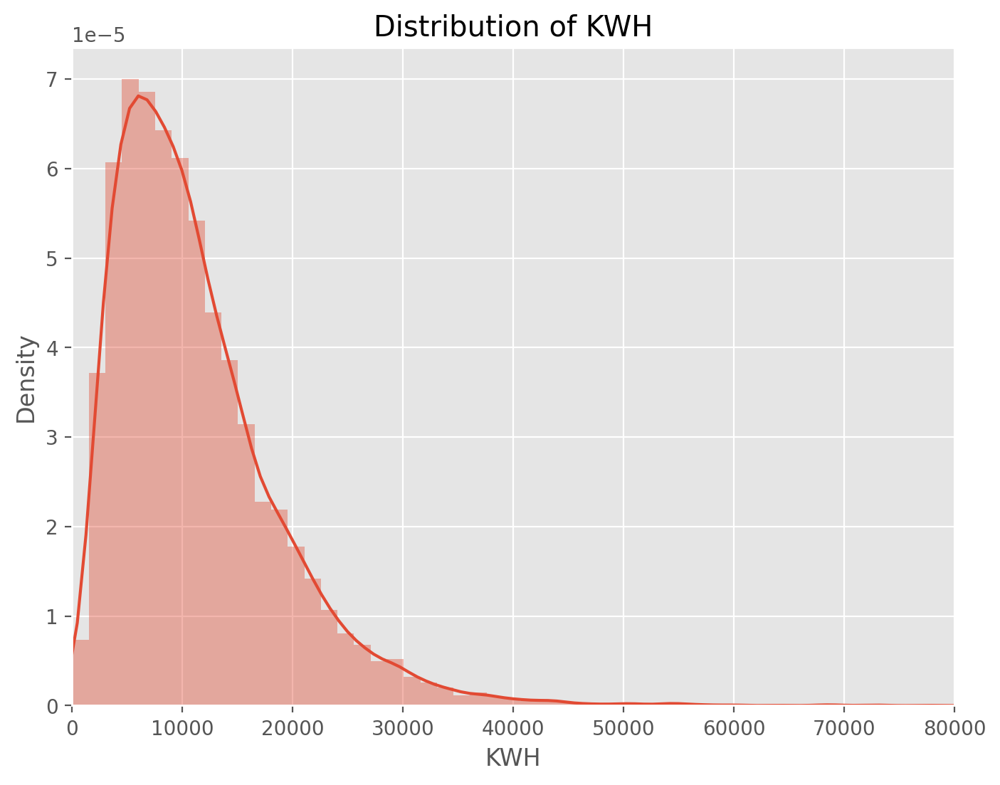

In [ ]:
#KWH is our target variable
fig, ax = plt.subplots(figsize=[8,6])
ax.set_xlim(0,80000)
sns.distplot(data['KWH'],ax=ax, bins=100).set_title('Distribution of KWH');

In [ ]:
#change attribute codes to attribute names
mapping = dict(zip(layout['Variable Name'], layout['Variable Label']))
data = data.rename(columns=mapping)

In [ ]:
data

,Unique identifier for each respondent,Census Region,Census Division,Reportable states and groups of states,Type of housing unit,Final sample weight,"Heating degree days in 2009, base temperature 65F","Cooling degree days in 2009, base temperature 65F","Heating degree days, 30-year average 1981-2010, base 65F","Cooling degree days, 30-year average 1981-2010, base 65F",...,Whether annualized kerosene consumption from Energy Supplier Survey billing data was scaled down,International Energy Conservation Code (IECC) climate zone (collapsed for public file),"Heating degree days in 2009, base temperature 50F","Cooling degree days in 2009, base temperature 80F","Heating degree days of ground temperature in 2009, base temperature 65F",Weather & shielding factor for the housing unit,Annual value for latent heat infiltration from outside air into the housing unit,Annual average ground water temperature (F) for 2009,Dry bulb design temperature (F) expected to be exceeded 99% of the time,Dry bulb design temperature (F) expected to be exceeded 1% of the time
0,1,2,4,12,2,2471.679999999999836,4742,1080,4953,1271,...,-2,4A,2117,56,4250,0.48,6,56,9,96
1,2,4,10,26,2,8599.170000000000073,2662,199,2688,143,...,-2,3C,62,26,2393,0.61,0,64,38,73
2,3,1,1,1,5,8969.920000000000073,6233,505,5741,829,...,-2,5A,2346,49,5654,0.48,3,52,12,88
3,4,2,3,7,2,18003.639999999999418,6034,672,5781,868,...,-2,5A,2746,0,4941,0.55,4,55,7,87
4,5,1,1,1,3,5999.609999999999673,5388,702,5313,797,...,-2,5A,2251,0,5426,0.61,4,50,13,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12078,12079,2,3,9,2,10219.799999999999272,7671,332,7784,451,...,-2,6A-6B,4289,39,7819,0.59,0,48,-3,84
12079,12080,3,7,21,4,8689.069999999999709,2085,2844,2520,2286,...,-2,3B-4B,360,393,1869,0.50,0,56,26,101
12080,12081,2,4,10,2,4697.210000000000036,7935,472,8074,600,...,-2,6A-6B,4494,22,8477,0.58,1,46,-9,89
12081,12082,4,8,23,2,13155.680000000000291,5834,770,5989,957,...,-2,5B-5C,2840,0,9010,0.54,1,53,13,93


In [ ]:
#central tendency measures on numerical columns
def midhinge(series):
    q1 = np.percentile(series, 25)
    q3 = np.percentile(series, 75)
    return (q1 + q3) / 2

# Function to calculate the trimean
def trimean(series):
    mean = np.mean(series)
    median = np.median(series)
    trimmed = trim_mean(series, proportiontocut=0.1)  # You can adjust the proportiontocut as needed
    return (mean + 2 * median + trimmed) / 4

# Define functions for mode, quartile, truncated mean
def mode(series):
    return series.mode().iloc[0]

def quartile(series, q):
    return np.percentile(series, q * 100)

def truncated_mean(series, alpha):
    sorted_series = np.sort(series)
    n = len(sorted_series)
    trim_count = int(alpha * n)
    trimmed_series = sorted_series[trim_count:-trim_count]
    return np.mean(trimmed_series)

# Calculate the statistics for each column
grouped_statistics = {}
for column in data.select_dtypes(include='number').columns:
    grouped_statistics[column] = {
        'Mean': data[column].mean()/data[column].max(),
        'Median': data[column].median()/data[column].max(),
        'Mode': mode(data[column])/data[column].max(),
        'Quartile': quartile(data[column]/data[column].max(), 0.25),
        'Midhinge': midhinge(data[column]/data[column].max()),
        'Truncated Mean': truncated_mean(data[column]/data[column].max(), 0.1),  # Adjust alpha as needed
        'Trimean': trimean(data[column]/data[column].max()),
    }
result_df = pd.DataFrame(grouped_statistics)
print(result_df)

                Unique identifier for each respondent      Census Region  \
Mean                                0.500041380451875  0.657080195315733   
Median                              0.500041380451875  0.750000000000000   
Mode                                0.000082760903749  0.750000000000000   
Quartile                            0.250062070677812  0.500000000000000   
Midhinge                            0.500041380451875  0.625000000000000   
Truncated Mean                      0.500041380451875  0.665097755249819   
Trimean                             0.500041380451875  0.705544487641388   

                  Census Division  Reportable states and groups of states  \
Mean            0.537308615410080                       0.547543073985183   
Median          0.500000000000000                       0.555555555555556   
Mode            0.500000000000000                       0.962962962962963   
Quartile        0.300000000000000                       0.296296296296296   
Midhin

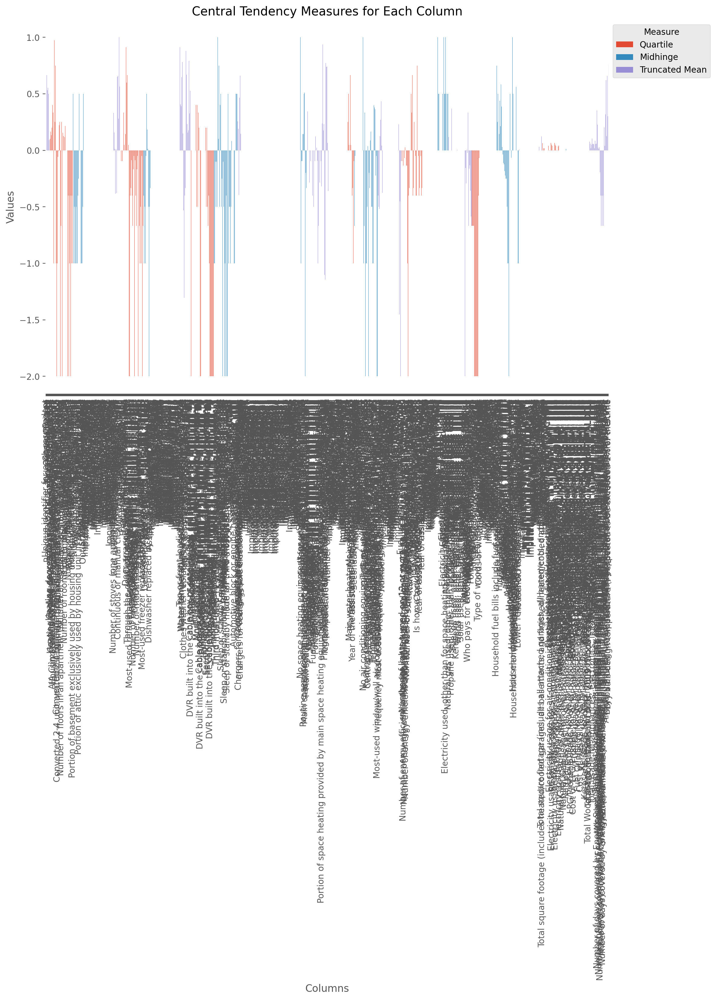

In [ ]:
fig, ax = plt.subplots(figsize=(12, 8))
result_df.T.plot(kind='bar', ax=ax)
plt.title('Central Tendency Measures for Each Column')
plt.xlabel('Columns')
plt.ylabel('Values')
plt.legend(title='Measure', bbox_to_anchor=(1, 1))
plt.show()

In [ ]:
#central tendency measures on categorical columns
data.describe(include=['object'])

,Housing unit in Census Metropolitan Statistical Area or Micropolitan Statistical Area,Housing unit classified as urban or rural by Census,Number of kerosene 'cash and carry' purchases,Gallons per kerosene 'cash and carry' purchase,International Energy Conservation Code (IECC) climate zone (collapsed for public file)
count,12083,12083,12083,12083,12083
unique,3,2,29,21,11
top,METRO,U,-2,-2,4A
freq,10302,9656,9958,9958,2703


Results DataFrame:
                                                       Range  \
Unique identifier for each respondent               12082.00   
Census Region                                           3.00   
Census Division                                         9.00   
Reportable states and groups of states                 26.00   
Type of housing unit                                    4.00   
...                                                      ...   
Weather & shielding factor for the housing unit         0.49   
Annual value for latent heat infiltration from ...     34.00   
Annual average ground water temperature (F) for...     53.00   
Dry bulb design temperature (F) expected to be ...     90.00   
Dry bulb design temperature (F) expected to be ...     58.00   

                                                      Standard Deviation  \
Unique identifier for each respondent               3488.205985890167995   
Census Region                                          1.042

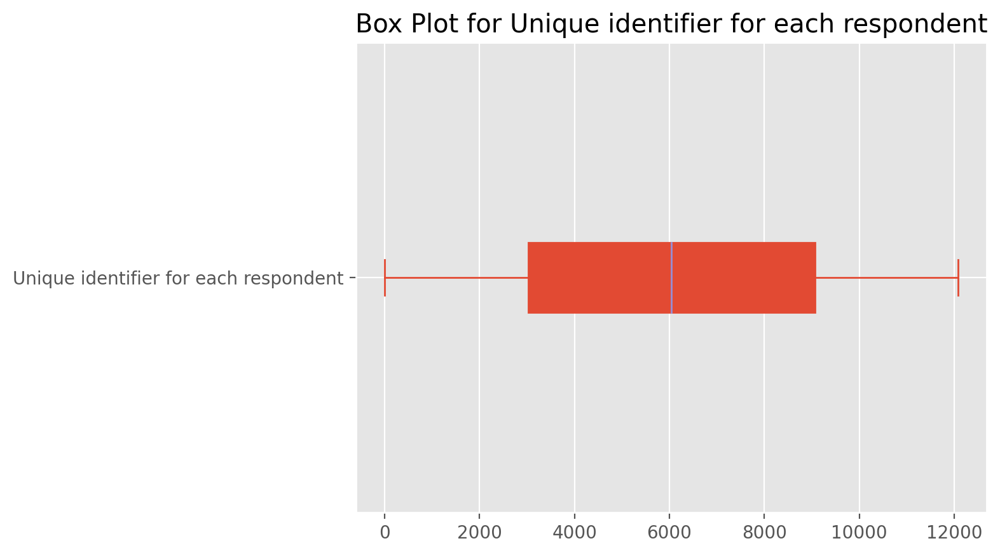

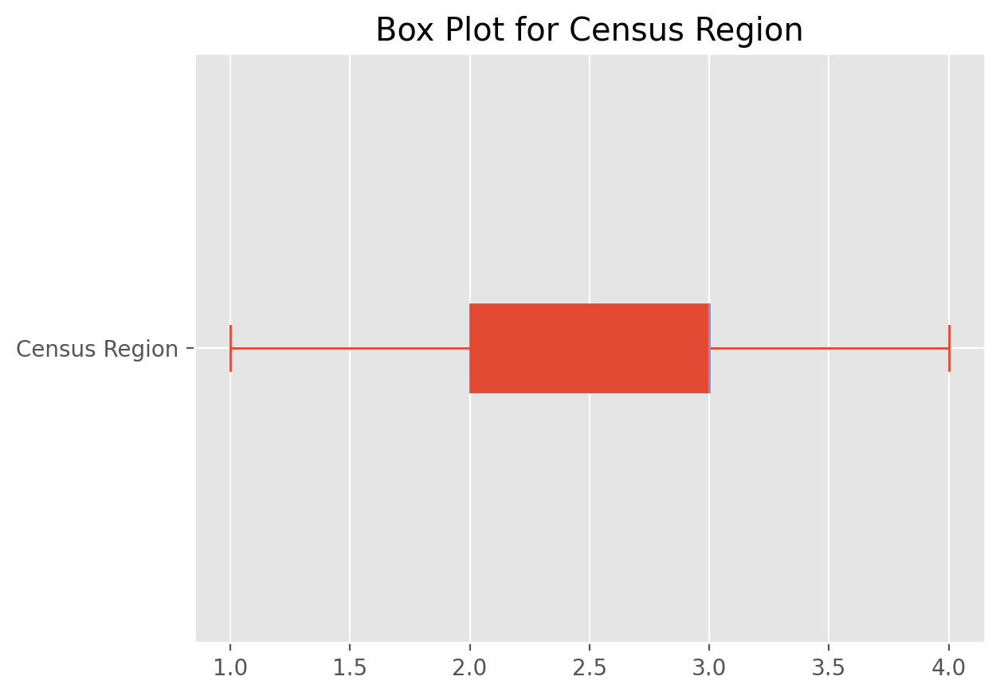

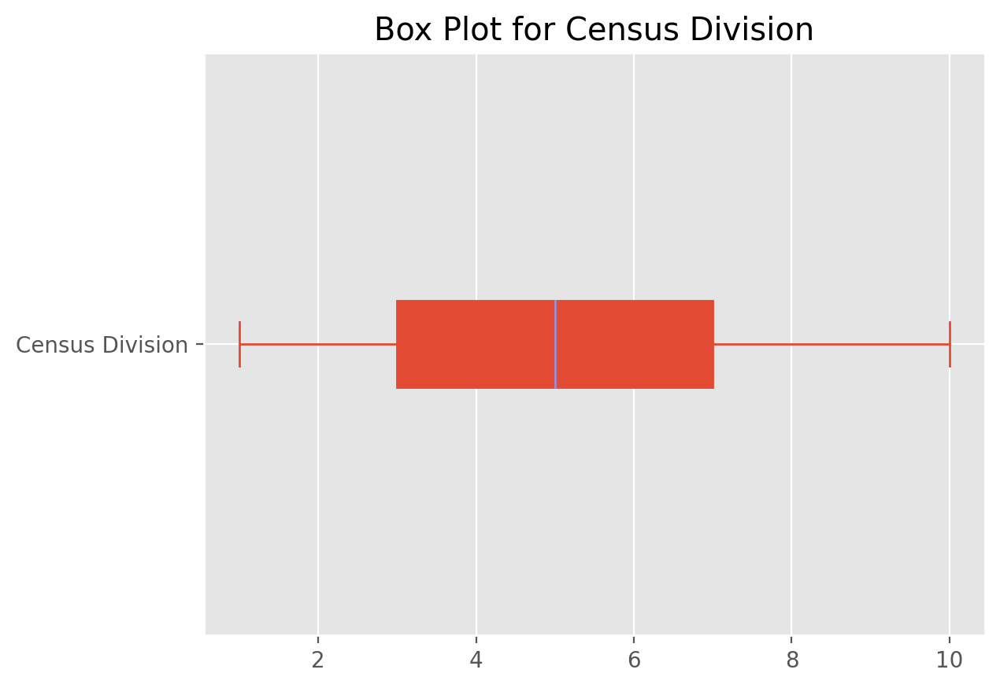

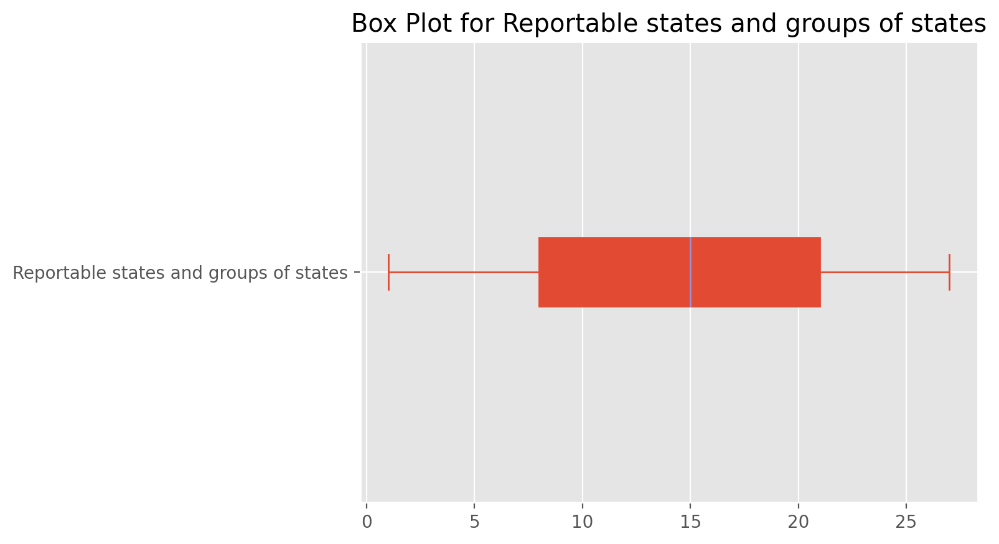

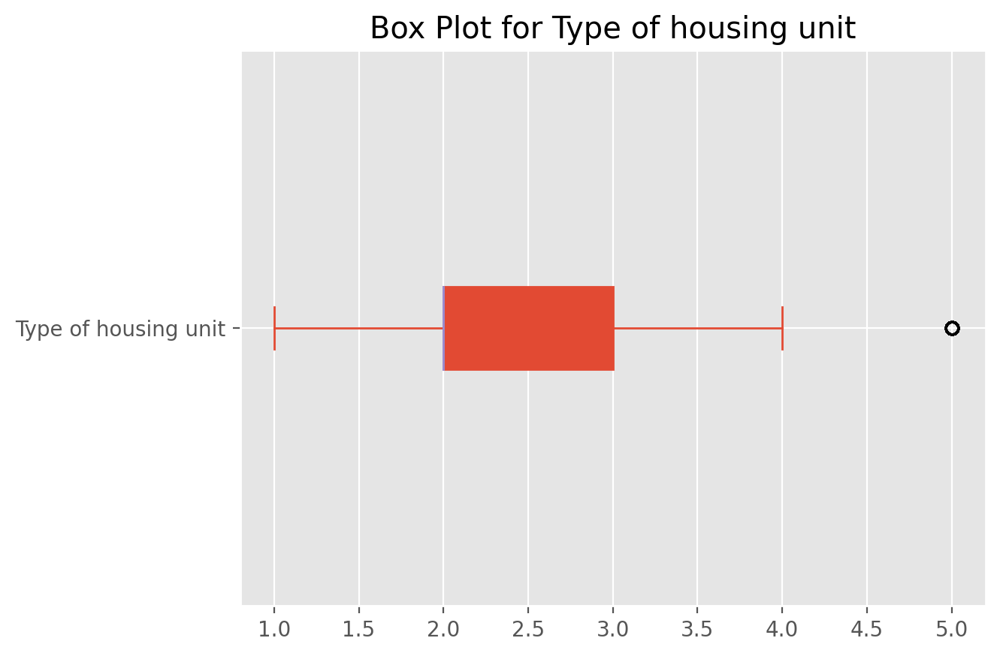

...

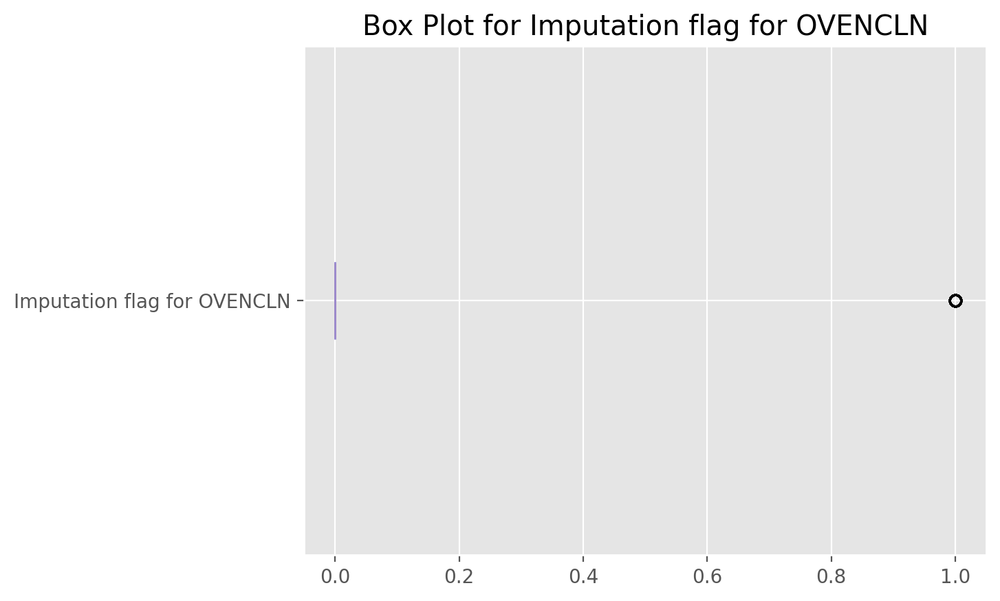

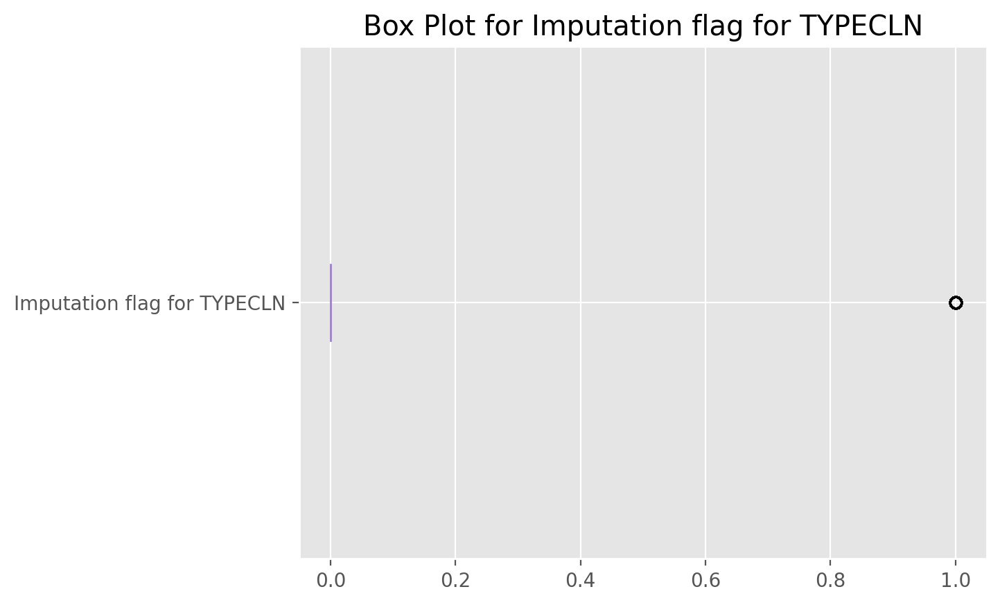

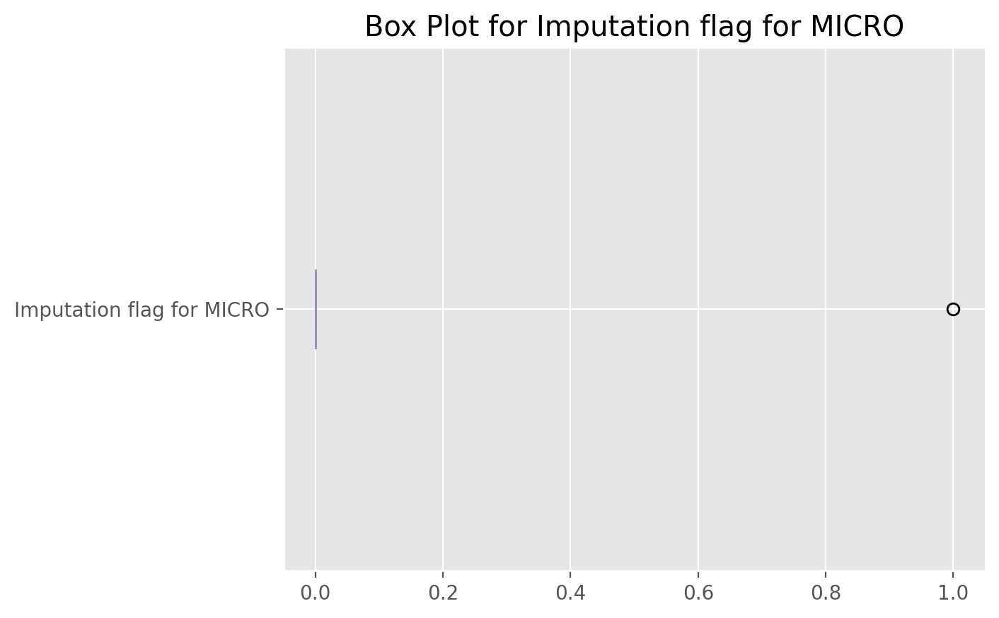

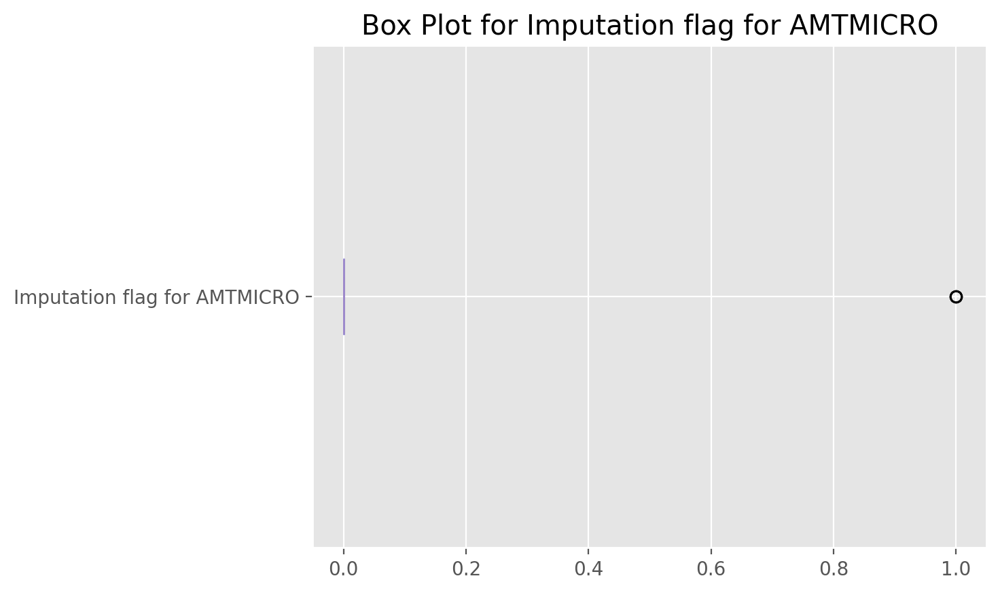

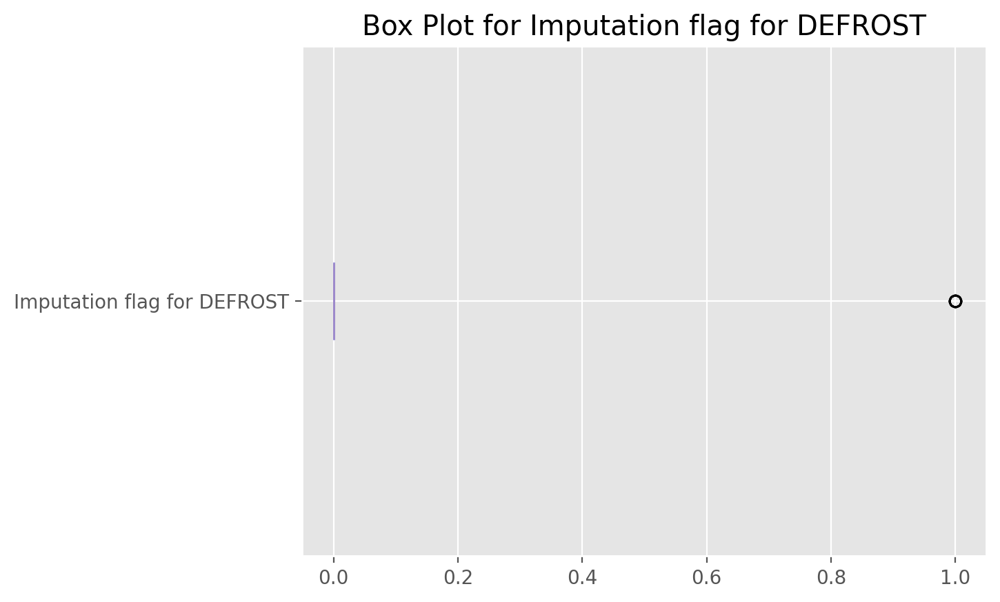

TypeError: no numeric data to plot

In [ ]:
#dispersion
categorical_columns = data.select_dtypes(include=['object']).columns
numerical_data = data.drop(categorical_columns, axis=1)
numerical_columns=numerical_data.columns
result_df = pd.DataFrame(index=numerical_columns)

for col in numerical_columns:
    result_df.loc[col, 'Range'] = data[col].max() - data[col].min()
    result_df.loc[col, 'Standard Deviation'] = data[col].std()
    result_df.loc[col, 'Mean Absolute Deviation'] = data[col].mad()
    result_df.loc[col, 'Interquartile Range'] = data[col].quantile(0.75) - data[col].quantile(0.25)

    # Detecting outliers
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    outliers = ((data[col] < (Q1 - 1.5 * IQR)) | (data[col] > (Q3 + 1.5 * IQR)))
    result_df.loc[col, 'Outliers'] = outliers.sum()

    # Calculating skewness
    result_df.loc[col, 'Skewness'] = skew(data[col])

# Displaying the result DataFrame
print("Results DataFrame:")
print(result_df)

# Creating box plots for each numerical column
for col in numerical_columns:
    data[col].plot(kind='box', vert=False, patch_artist=True)
    plt.title(f'Box Plot for {col}')
    plt.show()

In [ ]:
#shape analysis
print("Skewness: %f" % data['Total Site Electricity usage, in kilowatt-hours, 2009'].skew())
print("Kurtosis: %f" % data['Total Site Electricity usage, in kilowatt-hours, 2009'].kurt())

In [ ]:
corr_matrix = data.corr()

In [ ]:
threshold_corr = 0.4
corr_significant = corr_matrix["Total Site Electricity usage, in kilowatt-hours, 2009"].copy(deep =True)
corr_significant = corr_significant.loc[(corr_significant.values > threshold_corr) | \
                                       (corr_significant.values < -threshold_corr)]
print(f"Significant target variables are: \n\n {corr_significant.index[1:].values}\n")
print('*'*55)
print(f"\nAnd also their correaltions are: \n\n{(np.round(corr_significant[1:].values,2 ))}")

In [ ]:
corr_significant.sort_values(ascending=False)

Total Site Electricity usage, in kilowatt-hours, 2009                                                         1.000000000000000
Total Site Electricity usage, in thousand BTU, 2009                                                           0.999999999934381
Electricity usage for other purposes (all end-uses except SPH, COL, WTH, and RFG), in thousand BTU, 2009      0.880402768338534
Electricity usage for other purposes (all end-uses except SPH, COL, WTH, and RFG), in kilowatt-hours, 2009    0.880402705967658
Total Electricity cost, in whole dollars, 2009                                                                0.868711981839555
Electricity cost for other purposes (all end-uses except SPH, COL, WTH, and RFG), in wholedollars, 2009       0.702251492987539
Total usage for appliances, electronics, lighting, and miscellaneous uses, in thousand BTU, 2009              0.676107594064646
Total cost for appliances, electronics, lighting, and miscellaneous uses, in whole dollars, 2009        

In [ ]:
res = corr_significant.sort_values(ascending=False)[:35]
res
significant_columns = res.index.tolist()

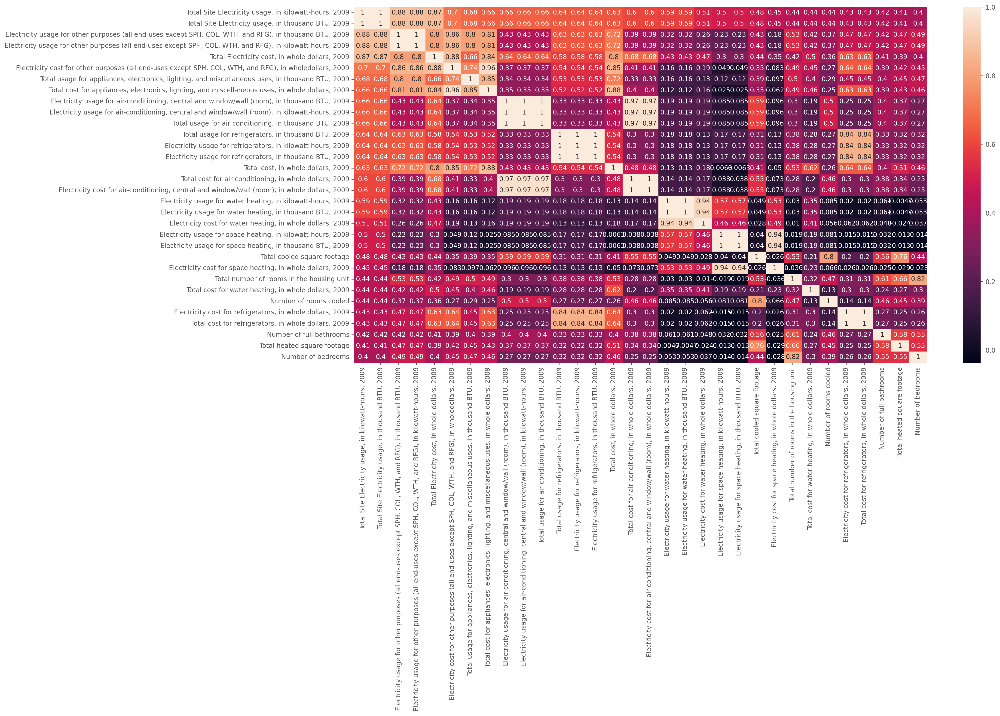

In [ ]:
# plot heatmap of the corr_significant
plt.figure(figsize = (20,10))
heatmap = sns.heatmap(data[res.index].corr(), annot = True)

In [ ]:
#column_to_plot = 'Total Site Electricity usage, in kilowatt-hours, 2009'
#numerical_columns = res.index
# Create scatter plots
#for column in numerical_columns:
#    if column != column_to_plot:  # Avoid plotting the column against itself
#        if(len(data[column])==len(data[column_to_plot])):
#          plt.scatter(data[column],data[column_to_plot])
#          plt.title(f'Scatter Plot:{column} vs {column_to_plot}')
#          plt.xlabel(column)
#          plt.ylabel(column_to_plot)
#          plt.show()

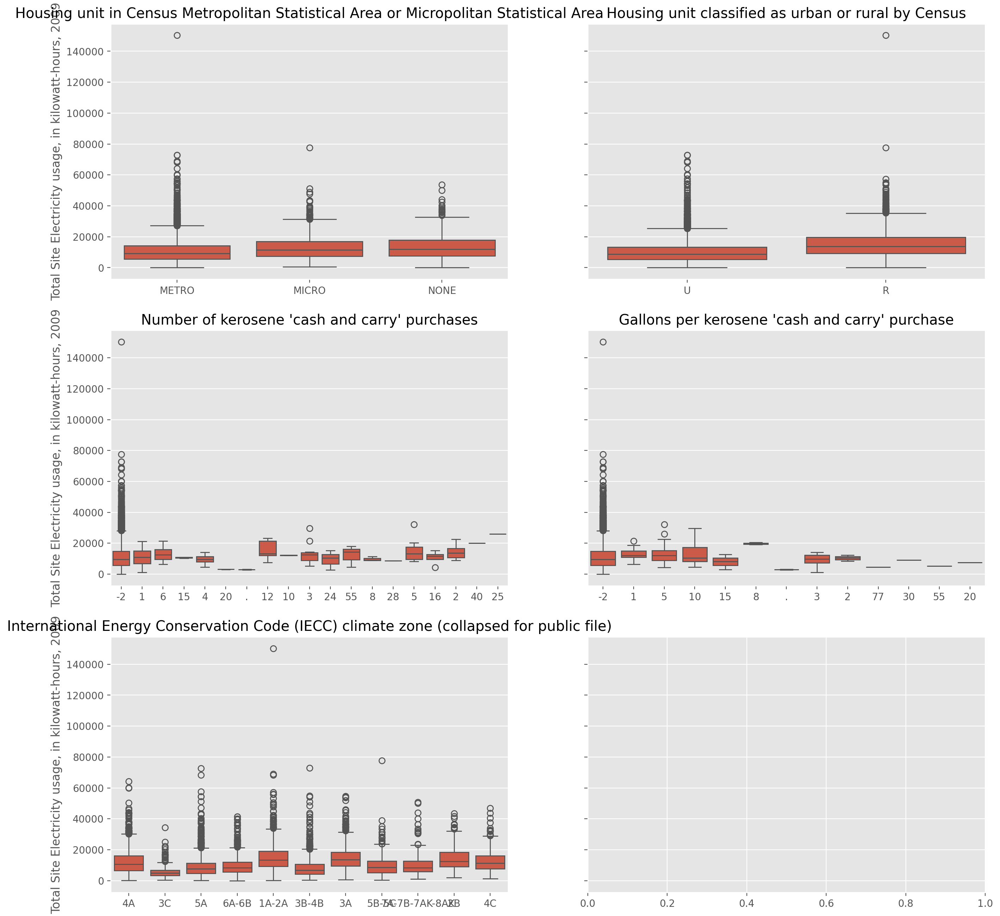

In [ ]:
fig, axes = plt.subplots(ncols=2, nrows=3, figsize=(4 * 4, 4 * 4), sharey=True)

axes = np.ravel(axes) #which is used to change a 2-dimensional array or a multi-dimensional array into a contiguous flattened array.

cols = ['Housing unit in Census Metropolitan Statistical Area or Micropolitan Statistical Area','Housing unit classified as urban or rural by Census',"Number of kerosene 'cash and carry' purchases","Gallons per kerosene 'cash and carry' purchase",'International Energy Conservation Code (IECC) climate zone (collapsed for public file)']

for i, c in zip(np.arange(len(axes)), cols):
    ax = sns.boxplot(x=c, y='Total Site Electricity usage, in kilowatt-hours, 2009', data=data, ax=axes[i])
    ax.set_title(c)
    ax.set_xlabel("")

In [ ]:
pip install scikit-learn

In [ ]:
data = pd.get_dummies(data, columns=cols)

In [ ]:
from sklearn.feature_selection import mutual_info_regression
from sklearn.preprocessing import LabelEncoder

In [ ]:
data=pd.read_csv("/content/recs2009_public.csv")

#change attribute codes to attribute names
mapping = dict(zip(layout['Variable Name'], layout['Variable Label']))
data = data.rename(columns=mapping)

In [ ]:
y = data['Total Site Electricity usage, in kilowatt-hours, 2009']

In [ ]:
short_cols=['Climate_Region_Pub',
'AIA_Zone',
'METROMICRO',
'UR',
'REPORTABLE',
'HHSEX',
'EMPLOYHH',
'SPOUSE',
'HHAGE',
'ATHOME',
'WORKPAY',
'MONEYPY',
'FOODASST',
'Householder_Race',
'EDUCATION',
'HBUSNESS',
'POVERTY100',
'PERIODEL',
'COST',
'NUMFLRS',
'NUMAPTS',
'YEARMADE',
'STUDIO',
'NAPTFLRS',
'BEDROOMS',
'TOTROOMS',
'CELLAR',
'BASEFIN',
'BASEHEAT',
'BASECOOL',
'ATTIC',
'PRKGPLC1',
'SIZEOFGARAGE',
'STOVEN',
'STOVE',
'OVENUSE',
'MICRO',
'OUTGRILL',
'TOPGRILL',
'NUMFRIG',
'SEPFREEZ',
'DISHWASH',
'CWASHER',
'DRYER',
'HEATHOME',
'TVCOLOR',
'COMPUTER',
'INTERNET',
'MOISTURE',
'HEATROOM',
'NUMTHERM',
'TEMPHOMEAC',
'AIRCOND',
'ACROOMS',
'TEMPHOMEAC',
'NUMBERAC',
'HIGHCEIL',
'SWIMPOOL',
'AUDIT',
'USENG',
'USEKERO',
'USEWOOD',
'USESOLAR',
'ONSITE',
'ONSITEGRID',
'KERODEL',
'WOODLOGS',
'TOTSQFT',
'TYPEHUQ',
'HDD30YR',
'CDD30YR',
'KOWNRENT',
'TYPEHUQ4',
'USELP',
'USEFO',
'NHSLDMEM']

In [ ]:
fullcols= [layout.iloc[i,1] for i in range(len(layout['Variable Name'])) if layout.iloc[i,0] in short_cols ]
# fullcols

In [ ]:
#info gain requires all cols to be numerical, encoding cat cols to numerical here
def encode_object_columns(df):
    label_encoder = LabelEncoder()
    for column in df.select_dtypes(include=['object']):
        df[column] = df[column].astype(str)  # Convert column to string in case it has both int and str datatypes
        df[column] = label_encoder.fit_transform(df[column])
    return df

data = encode_object_columns(data)

In [ ]:
X = data[fullcols]

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler= StandardScaler()

for col in X.columns:
  X[col] = scaler.fit_transform(X[col].values.reshape(-1,1))


In [ ]:
information_gain = mutual_info_regression(X, y)

In [ ]:
IG_data = pd.DataFrame({'Feature': X.columns, 'Information Gain': information_gain})

In [ ]:
IG_data

,Feature,Information Gain
0,Type of housing unit,0.103700767822206
1,"Heating degree days, 30-year average 1981-2010...",0.049296686453539
2,"Cooling degree days, 30-year average 1981-2010...",0.059662916066409
3,Building America Climate Region (collapsed for...,0.063945287544536
4,"AIA Climate Zone, based on average temperature...",0.055129611584199
...,...,...
68,2009 gross household income,0.031514022769674
69,Household income at or below 100% of poverty line,0.005436237274962
70,Household receives food stamps or WIC assistance,0.000000000000000
71,Total square footage (includes all attached ga...,0.120540282535691


In [ ]:
sorted_df = IG_data.sort_values(by='Information Gain', ascending=False)
df = sorted_df.head(10)
df.reset_index(drop=True, inplace=True)
print(df)

                                             Feature   Information Gain
0                             Number of rooms cooled  0.148319966093379
1          Total number of rooms in the housing unit  0.127746551018774
2                                 Number of bedrooms  0.122743697630465
3  Total square footage (includes all attached ga...  0.120540282535691
4                             Number of rooms heated  0.115288607869627
5  Temperature when someone is home during the da...  0.111082788248614
6                               Type of housing unit  0.103700767822206
7                                   Studio apartment  0.092679002891803
8  Number of floors in an apartment (Number of le...  0.092629030170992
9                         Clothes dryer used in home  0.090469254443276


In [ ]:
# df["Information Gain"]= df["Information Gain"]/max(df["Information Gain"])

In [ ]:
df

,Feature,Information Gain
0,Number of rooms cooled,0.148319966093379
1,Total number of rooms in the housing unit,0.127746551018774
2,Number of bedrooms,0.122743697630465
3,Total square footage (includes all attached ga...,0.120540282535691
4,Number of rooms heated,0.115288607869627
5,Temperature when someone is home during the da...,0.111082788248614
6,Type of housing unit,0.103700767822206
7,Studio apartment,0.092679002891803
8,Number of floors in an apartment (Number of le...,0.092629030170992
9,Clothes dryer used in home,0.090469254443276


In [ ]:
from sklearn.decomposition import PCA

In [ ]:
# for c in df.columns[data.dtypes == 'object']:
#     df[c] = df[c].factorize()[0]

In [ ]:
most_important= df["Feature"].tolist()
most_important

['Number of rooms cooled',
 'Total number of rooms in the housing unit',
 'Number of bedrooms',
 'Total square footage (includes all attached garages, all basements, and finished/heated/cooled attics)',
 'Number of rooms heated',
 'Temperature when someone is home during the day (summer)',
 'Type of housing unit',
 'Studio apartment',
 'Number of floors in an apartment (Number of levels in housing unit that is an apartment)',
 'Clothes dryer used in home']

In [ ]:
important_data= data[most_important]
important_data

,Number of rooms cooled,Total number of rooms in the housing unit,Number of bedrooms,"Total square footage (includes all attached garages, all basements, and finished/heated/cooled attics)",Number of rooms heated,Temperature when someone is home during the day (summer),Type of housing unit,Studio apartment,Number of floors in an apartment (Number of levels in housing unit that is an apartment),Clothes dryer used in home
0,9,9,4,5075,9,74,2,-2,-2,1
1,4,4,3,3136,4,-2,2,-2,-2,1
2,-2,2,1,528,2,-2,5,0,1,0
3,7,7,3,2023,7,74,2,-2,-2,1
4,-2,5,2,1912,5,-2,3,-2,-2,1
...,...,...,...,...,...,...,...,...,...,...
12078,5,6,3,2560,5,-2,2,-2,-2,1
12079,1,1,-2,502,1,-2,4,1,1,0
12080,8,8,4,4581,8,-2,2,-2,-2,1
12081,3,5,3,1728,5,-2,2,-2,-2,1


In [ ]:
scaler = StandardScaler()
for col in important_data.columns:
  important_data[col]= scaler.fit_transform(important_data[col].values.reshape(-1,1))


In [ ]:
num_components =25

In [ ]:
pca = PCA(n_components=num_components)
principal_components = pca.fit_transform(X)

In [ ]:
columns = [f'PC{i+1}' for i in range(num_components)]
pc_df = pd.DataFrame(data=principal_components, columns=columns)

In [ ]:
pca_data = pd.concat([IG_data, pc_df], axis=1)

In [ ]:
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = explained_variance_ratio.cumsum()

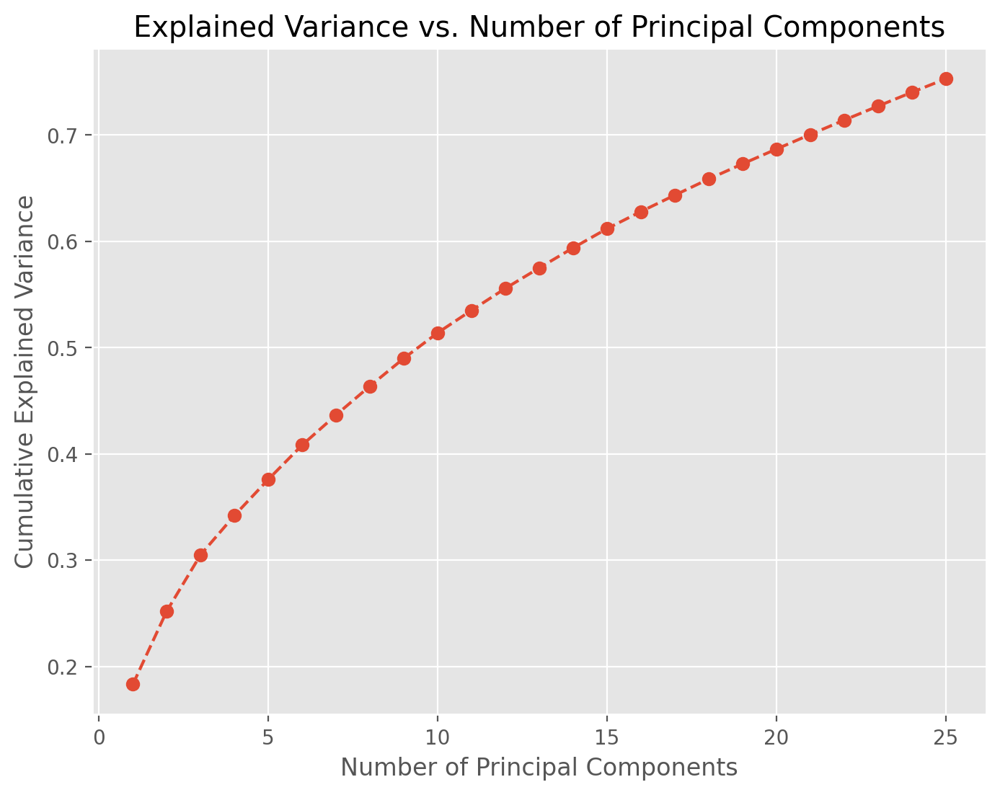

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(range(1, num_components + 1), cumulative_explained_variance, marker='o', linestyle='--')
plt.title('Explained Variance vs. Number of Principal Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

In [ ]:
pca_data

,Feature,Information Gain,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,...,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25
0,Type of housing unit,0.103700767822206,-4.982561281689885,0.028313086039983,-2.093091934175487,-0.024875656609717,0.657007538017083,-1.720864753445844,1.246200951271841,0.610645713475312,...,1.289402467136558,-1.150263175676101,-1.045249955449146,0.352534303210402,-0.676605738045730,0.269040144180005,-0.575802517188335,0.461388634063673,-0.563160748207374,0.161369594173933
1,"Heating degree days, 30-year average 1981-2010...",0.049296686453539,-0.620806844852028,-1.275794945934386,0.133136817366129,1.296928777227059,-1.302572128937893,0.486750174523863,-0.492516603182496,-2.050147507186544,...,0.386082376471224,1.018643273212517,-0.435360650513166,-0.824452849878364,-0.979666311513135,-0.271010186678921,-0.493832720945184,-0.353828823335484,-0.072624497020499,0.541392089802742
2,"Cooling degree days, 30-year average 1981-2010...",0.059662916066409,6.262787381500761,1.817033260472404,-2.938460098576050,0.461213851056048,0.371334976619151,0.311259882547406,-1.256391844096208,1.352235330120449,...,-0.778089450872620,0.791085079708865,-0.629238232444228,-0.229681224383152,0.096508052464444,-1.419212996645032,0.569484512318610,0.144802353964178,-0.334557622887075,-1.079971466919621
3,Building America Climate Region (collapsed for...,0.063945287544536,-2.174511909166899,-0.929946471917892,0.365129805424747,-3.410525652869207,1.954107350229044,0.923071855416221,0.105915787999844,-0.768197107778030,...,-0.833197740657662,2.104493324151570,-0.291995923555562,1.413482876016513,-1.513599446915622,-0.910096082866532,6.904928872908465,3.578171680905066,-0.975512509582014,2.140361356311372
4,"AIA Climate Zone, based on average temperature...",0.055129611584199,-0.975454218872704,2.060667443109733,-0.963701422614071,0.603861538507186,-1.251042653876486,0.059826540859357,-2.099875792252182,1.914056518449064,...,0.297008855542513,-0.352235154891238,-0.883331128860250,0.520810571858539,-0.231765969371227,0.969457187987512,-0.610798689479623,0.317101258160481,-0.938480850189831,0.611583962166589
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12078,NaN,NaN,-2.835442795266148,2.786915258643806,-0.478286454894855,0.716749828649404,0.860384506847135,0.528981025858525,-2.090952291676324,-0.497454991909764,...,-0.178058158765246,1.850727591849855,-1.384077184803306,-0.028374397302923,-0.846022172269000,-0.454512389804336,-0.171293218835262,0.440308123087778,-0.458526661624530,0.023639489294745
12079,NaN,NaN,7.031166257036355,0.041216539439561,-0.700654285974355,-1.107207984486354,-1.348006567074190,-0.060055869802499,-1.365689925606061,0.939408889333606,...,-1.178855925009450,-0.723624798289114,0.869291047180745,1.028870717837638,0.373758213569984,-2.302011133257010,-0.320861533096822,0.061318893396478,-1.606223993156681,-1.525800959096460
12080,NaN,NaN,-3.768528185499865,0.114323586440429,-2.697772721924487,0.782528696994491,0.240894703501619,-0.320901496834108,-0.163559152576754,0.733359974037832,...,-0.346767037247315,0.276576669709789,-0.770953935294023,0.592895251429495,-0.526552602058027,-0.740796994622829,0.116625665834454,-0.114515760923362,-0.200632221004853,-0.628053470922636
12081,NaN,NaN,-0.473081470517610,2.844280042973283,0.737771022487450,-0.785925991746084,-1.623670234309331,-0.908337922477289,-0.426103158959274,1.620073158936324,...,0.383843672984264,1.442735961045688,-1.488893411026454,0.793856810985951,0.861277432417872,-0.164991906717081,-0.123021294163931,0.329141645114912,-0.710147951885961,0.363687909384016


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Instantiate Linear Regression model
linear_reg_model = LinearRegression()

# Fit the model to the training data
linear_reg_model.fit(X_train, y_train)

# Predict on the test data
y_pred = linear_reg_model.predict(X_test)



In [ ]:
from sklearn.metrics import mean_squared_error

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error (RMSE):", rmse)


Root Mean Squared Error (RMSE): 4735.411297497866
